# Business Problem

SyriaTel faces a challenge with customer churn, where customers stop using their services, leading to lost revenue and increased costs to acquire new customers. The goal is to build a binary classification model to predict whether a customer will "soon" stop doing business with the company. By identifying predictable patterns in customer behavior, SyriaTel can take proactive measures to reduce churn, such as targeted marketing, improved service offerings, or loyalty programs. This will help the company retain its customer base and minimize financial losses.

# Stakeholders

The primary stakeholders are SyriaTel, a telecommunications company, and its management team, including departments responsible for customer retention, marketing, and financial performance. Secondary stakeholders may include customer service teams and data analysts who will utilize the insights from the classifier.om law enforcement.


In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading the dataset and displaying the first five rows
df = pd.read_csv('bigml.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [3]:
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

In [4]:
df.shape

(3333, 21)

# DATA CLEANING

In [5]:
# Check for missing values in columns
missing_values = df.isnull().sum()

# Print the result
print("Missing values in each column:")
print(missing_values)


Missing values in each column:
state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64


From the above , the dataset contains no missing values.

In [6]:
#Check for duplicates
df.duplicated().sum()

0

From the above we can conclude that there are no missing values.

In [7]:
# Checking for outliers

# function to detect outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)  
    Q3 = data[column].quantile(0.75)  
    IQR = Q3 - Q1                
    lower_bound = Q1 - 1.5 * IQR  
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Check for outliers in relevant columns
numeric_columns = df.select_dtypes(include='number').columns
for column in numeric_columns:
    outliers = detect_outliers_iqr(df, column)
    print(f"Column: {column}")
    print(f"Number of outliers: {len(outliers)}")
    print(outliers.head(), "\n")

Column: account length
Number of outliers: 18
    state  account length  area code phone number international plan  \
197    TX             208        510     378-3625                 no   
238    WY             215        510     393-9619                 no   
309    SD             209        415     413-5310                 no   
416    DE             224        510     361-6563                yes   
817    UT             243        510     355-9360                 no   

    voice mail plan  number vmail messages  total day minutes  \
197              no                      0              326.5   
238              no                      0               83.6   
309              no                      0              227.2   
416              no                      0              171.5   
817              no                      0               95.5   

     total day calls  total day charge  ...  total eve calls  \
197               67             55.51  ...              113   
23

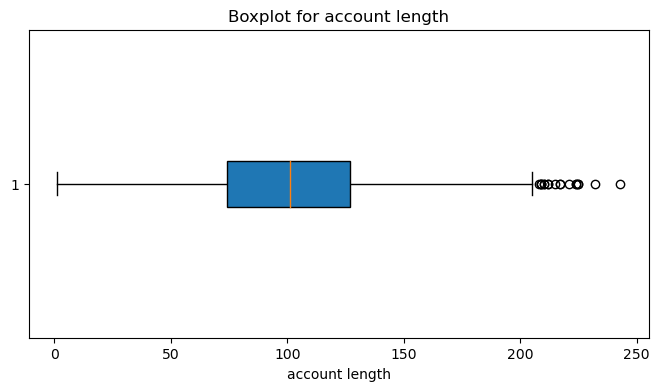

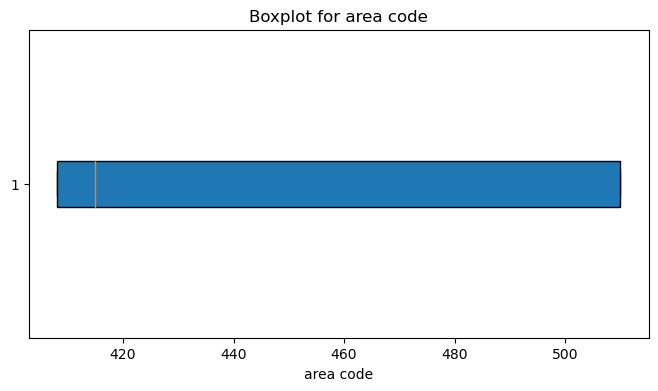

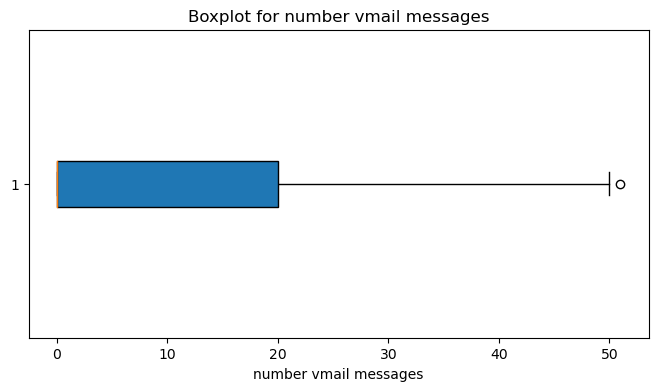

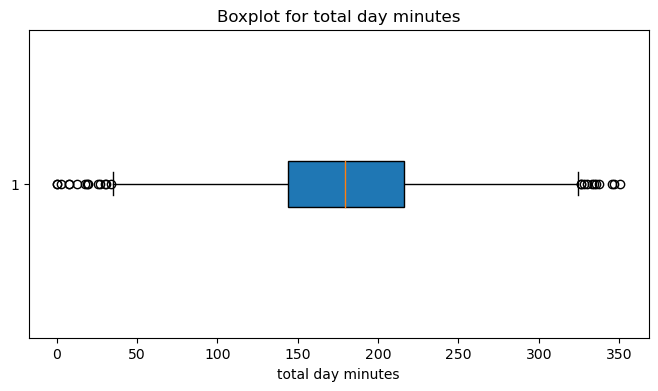

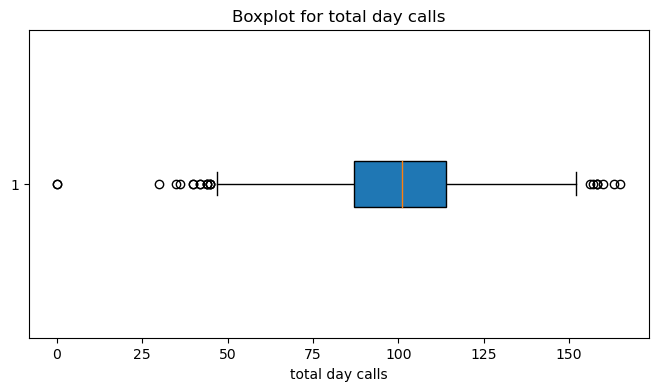

...

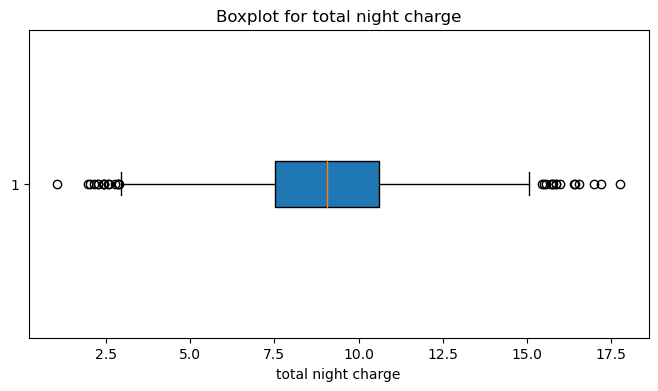

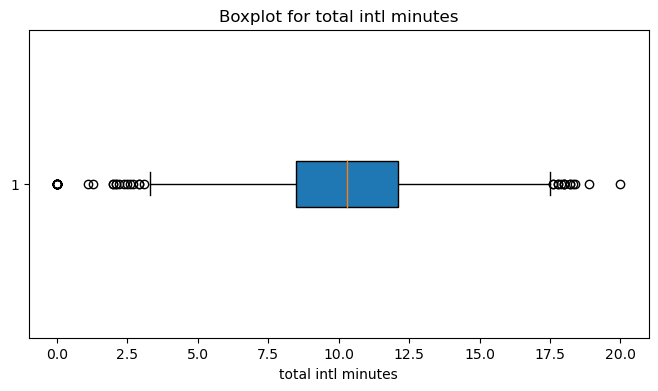

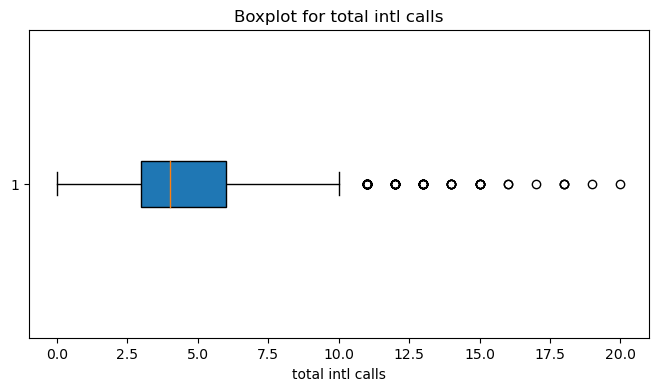

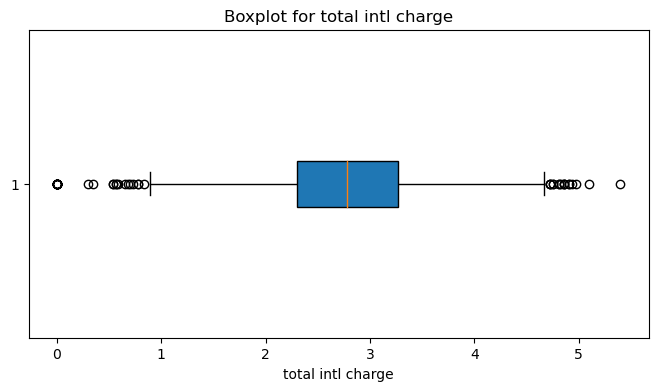

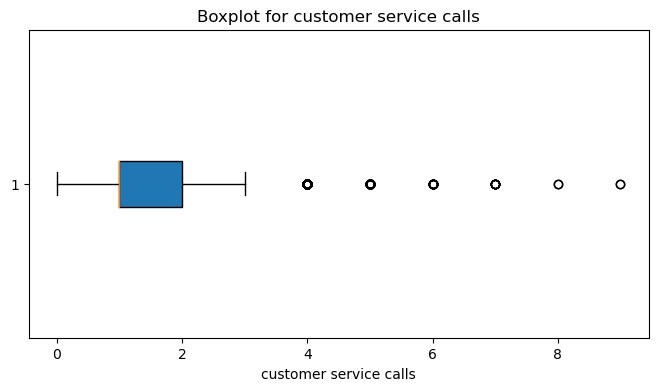

In [8]:
# Boxplots for numeric columns
for column in numeric_columns:
    plt.figure(figsize=(8, 4))
    plt.boxplot(df[column].dropna(), vert=False, patch_artist=True)
    plt.title(f"Boxplot for {column}")
    plt.xlabel(column)
    plt.show()


## Outlier Analysis

The table below summarizes the number of outliers detected in each numeric column of the dataset:

| **Column**               | **Number of Outliers** |
|---------------------------|------------------------|
| Account Length           | 18                    |
| Area Code                | 0                     |
| Number Vmail Messages    | 1                     |
| Total Day Minutes        | 25                    |
| Total Day Calls          | 23                    |
| Total Day Charge         | 25                    |
| Total Eve Minutes        | 24                    |
| Total Eve Calls          | 20                    |
| Total Eve Charge         | 24                    |
| Total Night Minutes      | 30                    |
| Total Night Calls        | 22                    |
| Total Night Charge       | 30                    |
| Total Intl Minutes       | 46                    |
| Total Intl Calls         | 78                    |
| Total Intl Charge        | 49                    |

### Observations:
- **Total Intl Calls** has the highest number of outliers (78), indicating variability in customer behavior for international calls.
- Columns related to charges (e.g., Day, Eve, Night, Intl) show outliers consistent with the corresponding minutes columns, confirming the correlation between usage and cost.
- The **Area Code** column has no outliers, suggesting consistent categorization.



In [9]:
# Define a function to calculate the percentage of outliers in a column
def outlier_percentage(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    percentage = (len(outliers) / len(df)) * 100
    return percentage

# Calculate percentage of outliers for numeric columns
numeric_columns = df.select_dtypes(include='number').columns
outlier_percentages = {}

for column in numeric_columns:
    outlier_percentages[column] = outlier_percentage(df, column)

# Display results
for column, percentage in outlier_percentages.items():
    print(f"Column: {column}, Outlier Percentage: {percentage:.2f}%")


Column: account length, Outlier Percentage: 0.54%
Column: area code, Outlier Percentage: 0.00%
Column: number vmail messages, Outlier Percentage: 0.03%
Column: total day minutes, Outlier Percentage: 0.75%
Column: total day calls, Outlier Percentage: 0.69%
Column: total day charge, Outlier Percentage: 0.75%
Column: total eve minutes, Outlier Percentage: 0.72%
Column: total eve calls, Outlier Percentage: 0.60%
Column: total eve charge, Outlier Percentage: 0.72%
Column: total night minutes, Outlier Percentage: 0.90%
Column: total night calls, Outlier Percentage: 0.66%
Column: total night charge, Outlier Percentage: 0.90%
Column: total intl minutes, Outlier Percentage: 1.38%
Column: total intl calls, Outlier Percentage: 2.34%
Column: total intl charge, Outlier Percentage: 1.47%
Column: customer service calls, Outlier Percentage: 8.01%


#### Handling Outliers
Since the outliers represent a very small percentage of the data, I am going to drop the outliers

In [10]:
# Function to remove outliers for a single column
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile
    Q3 = df[column].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1                     # Interquartile range
    lower_bound = Q1 - 1.5 * IQR      # Lower bound
    upper_bound = Q3 + 1.5 * IQR      # Upper bound
    # Filter data within bounds
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers for all numeric columns
numeric_columns = df.select_dtypes(include='number').columns  # Identify numeric columns

for column in numeric_columns:
    df = remove_outliers(df, column)

# Display dataset after removing outliers
print(f"Dataset shape after removing outliers: {df.shape}")


Dataset shape after removing outliers: (2797, 21)


In [11]:
df.shape

(2797, 21)

## Data Understanding 

In [12]:
# Display info
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2797 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   2797 non-null   object 
 1   account length          2797 non-null   int64  
 2   area code               2797 non-null   int64  
 3   phone number            2797 non-null   object 
 4   international plan      2797 non-null   object 
 5   voice mail plan         2797 non-null   object 
 6   number vmail messages   2797 non-null   int64  
 7   total day minutes       2797 non-null   float64
 8   total day calls         2797 non-null   int64  
 9   total day charge        2797 non-null   float64
 10  total eve minutes       2797 non-null   float64
 11  total eve calls         2797 non-null   int64  
 12  total eve charge        2797 non-null   float64
 13  total night minutes     2797 non-null   float64
 14  total night calls       2797 non-null   

In [13]:
# Describing the data
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000,2797.000000
mean,100.392206,437.445120,8.131212,179.995817,100.577047,30.599828,201.288059,100.020379,17.109714,201.175366,100.047193,9.052942,10.310976,4.311763,2.784483,1.306400
std,39.329033,42.542728,13.707224,52.589516,19.284581,8.940156,49.042830,19.225656,4.168704,48.827301,19.052069,2.197284,2.594138,2.073932,0.700338,0.975453
min,1.000000,408.000000,0.000000,37.700000,47.000000,6.410000,66.000000,48.000000,5.610000,65.700000,48.000000,2.960000,3.400000,1.000000,0.920000,0.000000
25%,73.000000,408.000000,0.000000,144.000000,87.000000,24.480000,167.200000,87.000000,14.210000,167.600000,87.000000,7.540000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,179.800000,101.000000,30.570000,201.400000,100.000000,17.120000,201.100000,101.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,19.000000,216.000000,114.000000,36.720000,235.100000,113.000000,19.980000,235.800000,113.000000,10.610000,12.100000,6.000000,3.270000,2.000000
max,205.000000,510.000000,50.000000,322.500000,152.000000,54.830000,336.000000,154.000000,28.560000,334.700000,152.000000,15.060000,17.300000,10.000000,4.670000,3.000000


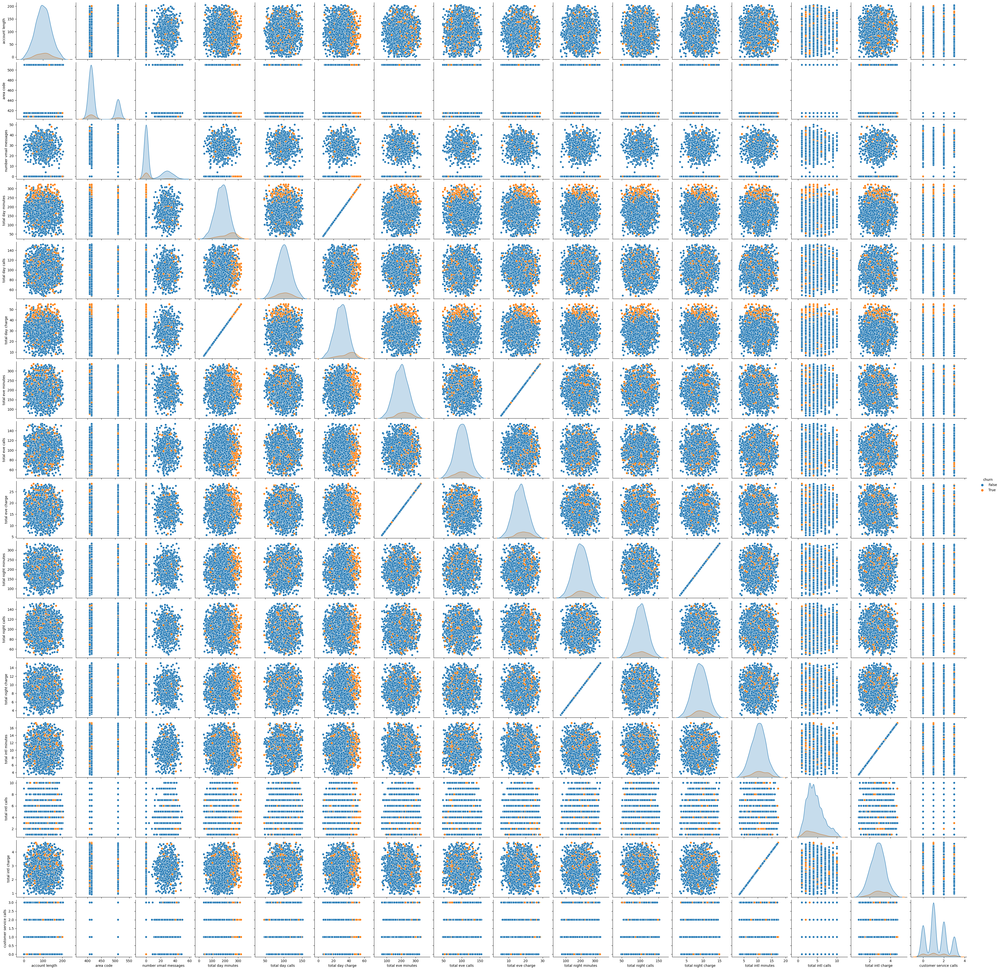

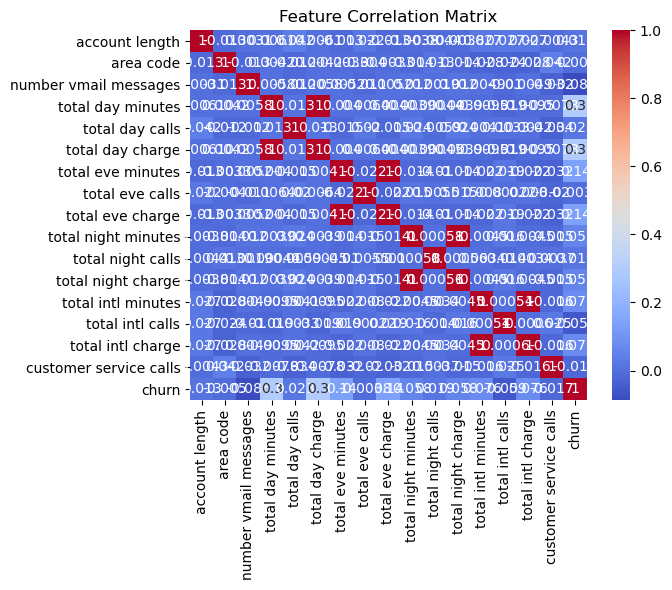

In [14]:
# Check data distributions
sns.pairplot(df, hue="churn", diag_kind="kde")
plt.show()

# Check correlations
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Feature Correlation Matrix")
plt.show()

### Churn Distribution
A bar chart to see the proportion of customers who churned vs. those who didn’t.

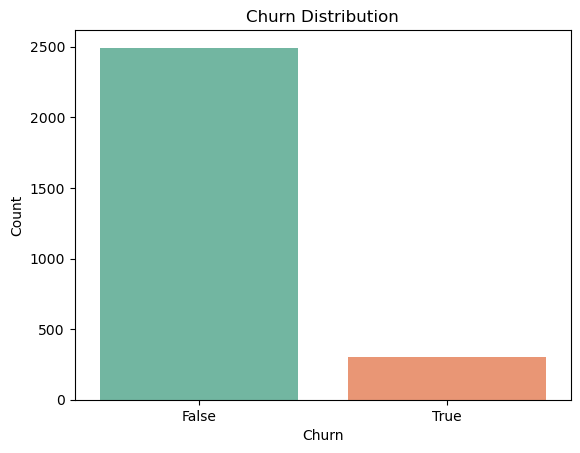

In [15]:
# A bar chart to see the proportion of customers who churned vs. those who didn’t.
# Import library
import seaborn as sns
sns.countplot(x='churn', data=df, palette='Set2')
plt.title('Churn Distribution')
plt.xlabel('Churn')
plt.ylabel('Count')
plt.show()

## Total Day Minutes vs. Churn
A boxplot to compare total day minutes for customers who churned and those who didn’t

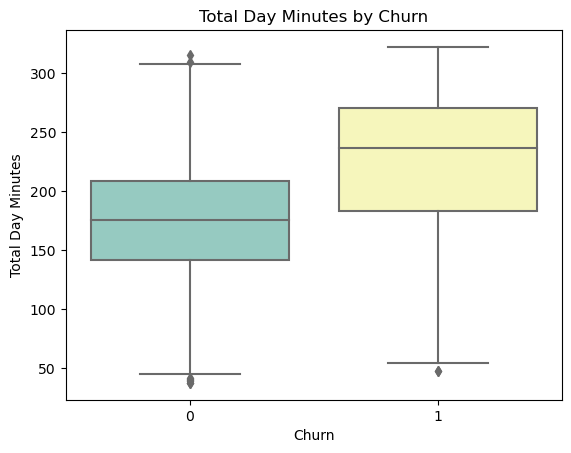

In [22]:
sns.boxplot(x='churn', y='total day minutes', data=df, palette='Set3')
plt.title('Total Day Minutes by Churn')
plt.xlabel('Churn')
plt.ylabel('Total Day Minutes')
plt.show()

## Customer Service Calls vs. Churn
A bar plot showing the relationship between the number of customer service calls and churn.

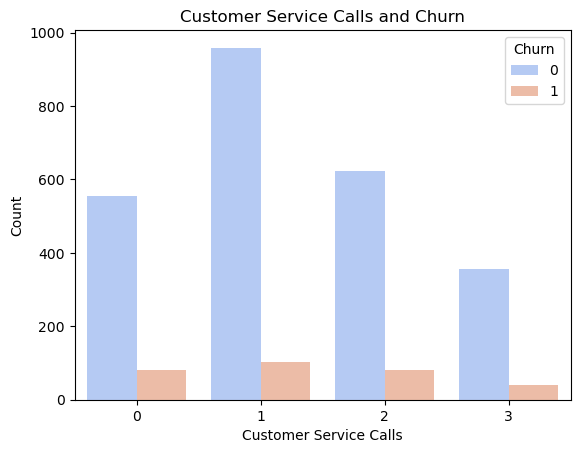

In [23]:
sns.countplot(x='customer service calls', hue='churn', data=df, palette='coolwarm')
plt.title('Customer Service Calls and Churn')
plt.xlabel('Customer Service Calls')
plt.ylabel('Count')
plt.legend(title='Churn', loc='upper right')
plt.show()

## International Plan Impact
A bar chart showing churn distribution based on the international plan.

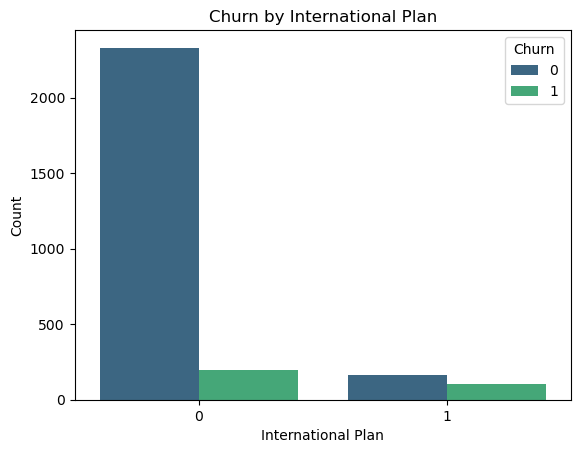

In [24]:
sns.countplot(x='international plan', hue='churn', data=df, palette='viridis')
plt.title('Churn by International Plan')
plt.xlabel('International Plan')
plt.ylabel('Count')
plt.legend(title='Churn', loc='upper right')
plt.show()

# Data Visualization Summary

1. **Churn Distribution**  
   The dataset is imbalanced, with significantly fewer customers who churned compared to those who did not. This highlights the need for appropriate handling methods, such as oversampling or undersampling, when building models.

2. **Total Day Minutes vs. Churn**  
   Customers who churn tend to have higher total day minutes on average. This indicates that high usage during the day might be a predictor of churn.

3. **Customer Service Calls vs. Churn**  
   Customers who made more customer service calls are more likely to churn. This suggests dissatisfaction or unresolved issues might lead to churn.

4. **International Plan Impact**  
   Customers subscribed to the international plan have a higher churn rate compared to those who are not subscribed. This could indicate pricing or service dissatisfaction with the international plan.

5. **Correlation Heatmap**  
   Features like `total day minutes`, `total day charge`, and `customer service calls` show notable correlations with churn. These features can be considered key variables for further analysis and modeling.

6. **Pairplot (`sns.pairplot`)**
- **Scatter Plots:** Show relationships between features, with colors indicating `churn` status.
- **KDE Plots:** Highlight feature distributions; distinct peaks suggest strong predictors for churn.

7. *Correlation Heatmap (`sns.heatmap`)*
- **Positive Correlations (Red):** Features increase together.
- **Negative Correlations (Blue):** Features inversely related.
- **Insights:** Strong correlations suggest redundancy; weak correlations indicate independence.
- 



## Data Preparation

In [16]:
# Import libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [17]:
# Encode categorical variables
label_encoder = LabelEncoder()
df["international plan"] = label_encoder.fit_transform(df["international plan"])
df["voice mail plan"] = label_encoder.fit_transform(df["voice mail plan"])
df["churn"] = label_encoder.fit_transform(df["churn"])


In [18]:
# Split features and target
X = df.drop(columns=["churn", "state", "phone number"])
y = df["churn"]

# Scale numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Modeling

In [19]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Train a Random Forest model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate with cross-validation
scores = cross_val_score(model, X_train, y_train, cv=5, scoring="accuracy")
print(f"Cross-Validation Accuracy: {scores.mean():.2f}")

Cross-Validation Accuracy: 0.96


# Evaluation

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       490
           1       0.98      0.63      0.77        70

    accuracy                           0.95       560
   macro avg       0.96      0.81      0.87       560
weighted avg       0.95      0.95      0.95       560



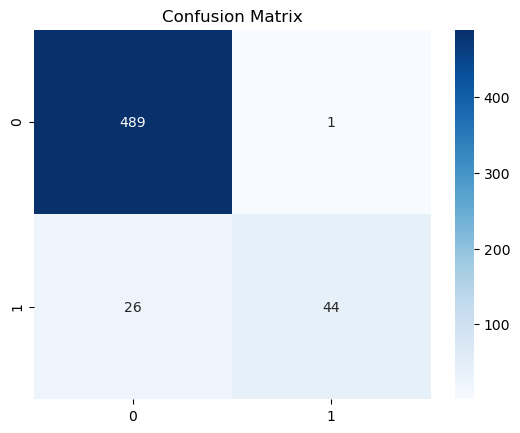

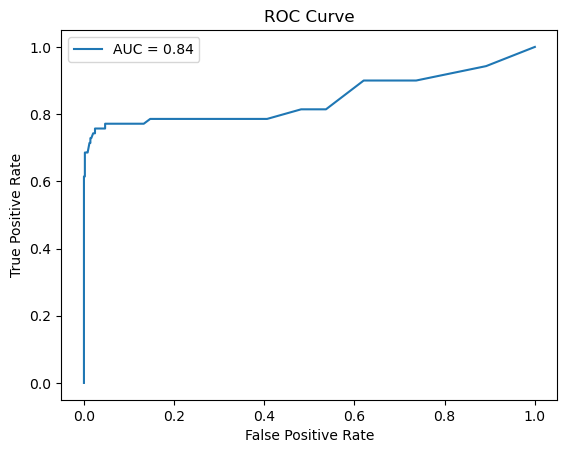

In [20]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

# Predict on test data
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test, y_prob):.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


# Deployment

In [21]:
import joblib

# Save the trained model
joblib.dump(model, "churn_model.pkl")
joblib.dump(scaler, "scaler.pkl")

# Load the model and scaler for inference
loaded_model = joblib.load("churn_model.pkl")
loaded_scaler = joblib.load("scaler.pkl")

# Example prediction# Replace these values with actual data for all 18 features, in the correct order
example_data = [[128, 415, 3624567, 0, 1, 0, 265.1, 110, 45.07, 99, 16.78, 244.7, 91, 11.01, 10.0, 3, 2.70, 1]]

# Ensure the data is scaled using the same scaler
example_data_scaled = loaded_scaler.transform(example_data)

# Predict churn
prediction = loaded_model.predict(example_data_scaled)
print("Churn Prediction:", "Yes" if prediction[0] else "No")


Churn Prediction: No


### Conclusion
The analysis of the customer dataset has revealed key insights into factors influencing churn. Significant findings include:  
1. **High Daytime Usage**: Customers with higher total day minutes are more likely to churn, suggesting potential dissatisfaction among high-usage customers.  
2. **Customer Service Interaction**: Increased customer service calls correlate with higher churn, indicating that unresolved complaints or poor customer service could drive customers away.  
3. **International Plan**: Customers subscribed to the international plan exhibit a higher churn rate, potentially highlighting dissatisfaction with the plan’s pricing or value.  
4. **Imbalance in Churn Data**: The dataset has an imbalance, with fewer churned customers, which requires careful handling in predictive modeling to avoid biased results.



### Recommendations
1. **Enhance Customer Service**: Analyze common customer complaints and train service representatives to address issues more effectively. Consider providing proactive support to high-risk customers.  
2. **Optimize Plans for High-Usage Customers**: Introduce customized plans or incentives for customers with high daytime usage to increase satisfaction and retention.  
3. **Reassess the International Plan**: Review the pricing and features of the international plan to ensure it provides competitive value. Conduct targeted surveys to understand customer dissatisfaction.  
4. **Data Balancing for Modeling**: Use techniques like SMOTE (Synthetic Minority Oversampling Technique) or undersampling to handle the imbalance in the dataset before applying machine learning models.  
5. **Predictive Modeling**: Build a churn prediction model using the key factors identified in the analysis, such as `total day minutes`, `customer service calls`, and `international plan`. Focus on early intervention strategies for high-risk customers.  
